In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
import cv2
from PIL import Image

In [2]:
band_paths = []

for i in range(1, 12):
    path = f"/mnt/data/Optical/Landsat_8/LC09_L1TP_165039_20250730_20250801_02_T1/LC09_L1TP_165039_20250730_20250801_02_T1_B{i}.TIF"
    band_paths.append(path)

In [3]:
band = []
for i in range(1, 12):
    with rasterio.open(band_paths[i-1]) as src:
        b = src.read(1)
        band.append(b)

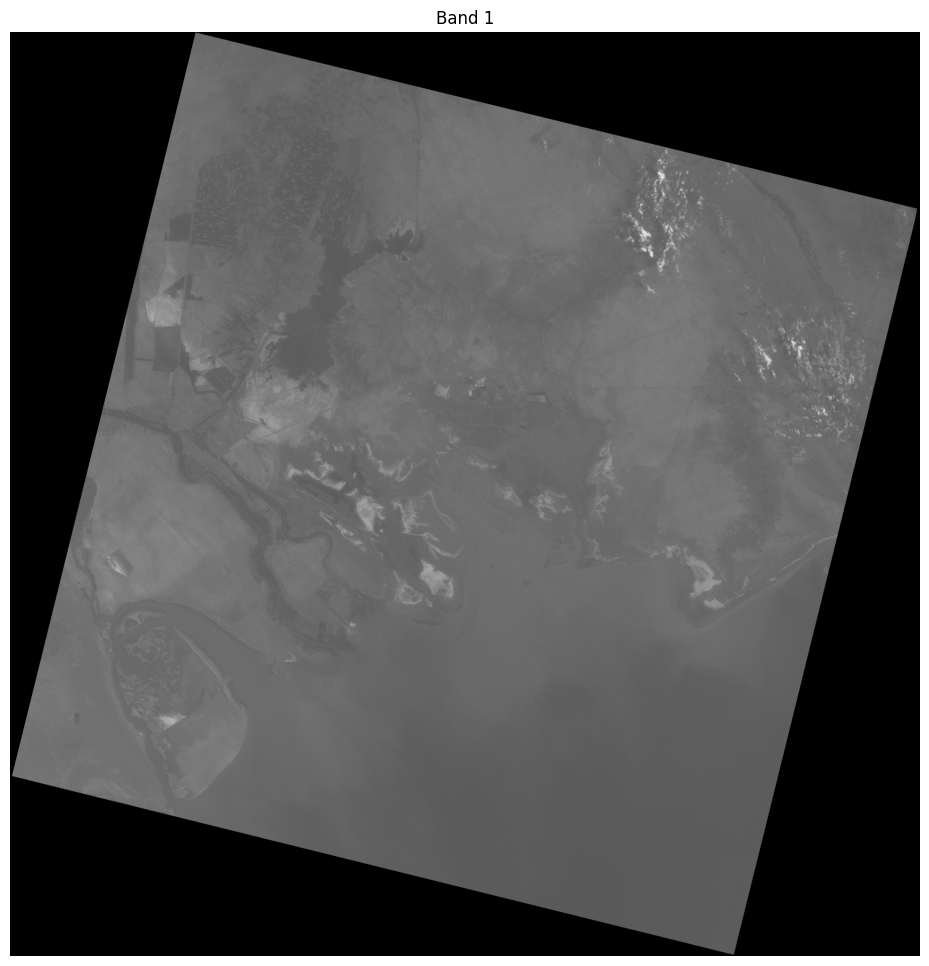

In [4]:
plt.figure(figsize=(12, 12))
plt.imshow(band[0], cmap='gray')
plt.title(f"Band 1")
plt.axis('off')
plt.show()

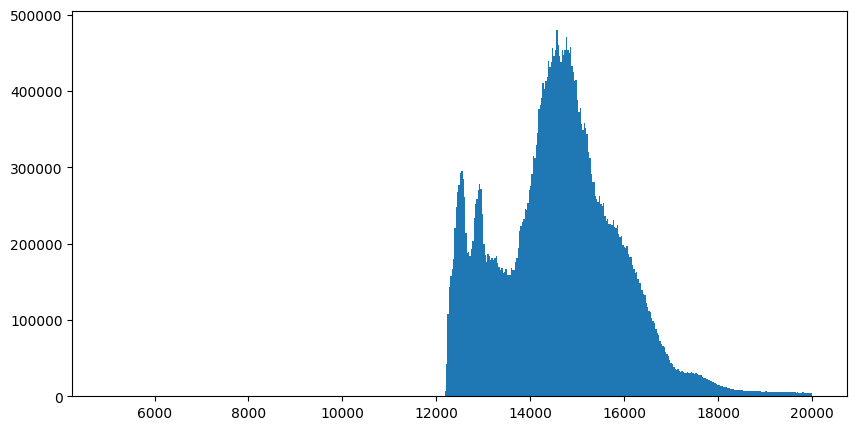

In [5]:
plt.figure(figsize=[10,5])
plt.hist(band[0].flatten(), bins=256*2,range= [5000,20000])
plt.show()

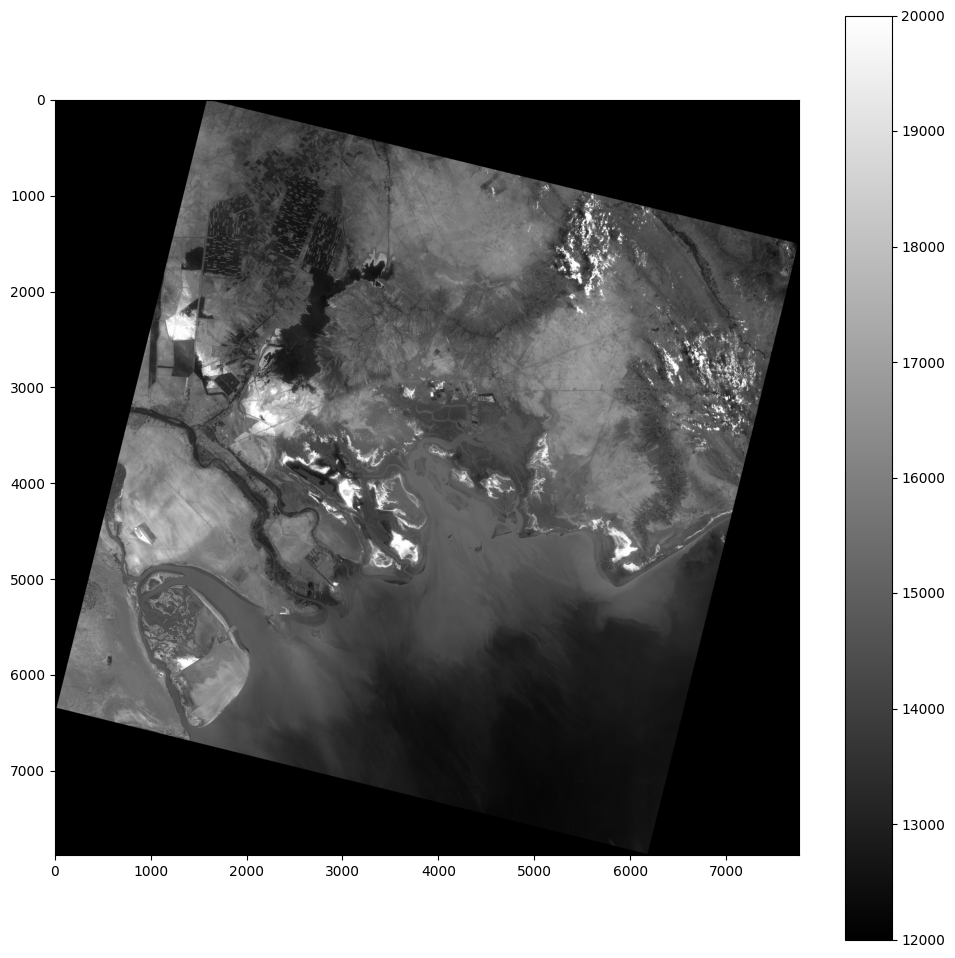

In [6]:
plt.figure(figsize=[12,12])
plt.imshow(band[0], vmin=12000, vmax=20000, cmap = 'gray')
plt.colorbar()

In [7]:
for i in range(0,11):
    print(band[i].shape)

(7881, 7761)
(7881, 7761)
(7881, 7761)
(7881, 7761)
(7881, 7761)
(7881, 7761)
(7881, 7761)
(15761, 15521)
(7881, 7761)
(7881, 7761)
(7881, 7761)


In [8]:
band_1_cropped = band[0][3000:5000,2000:4000].copy()
print(band_1_cropped.shape)

(2000, 2000)


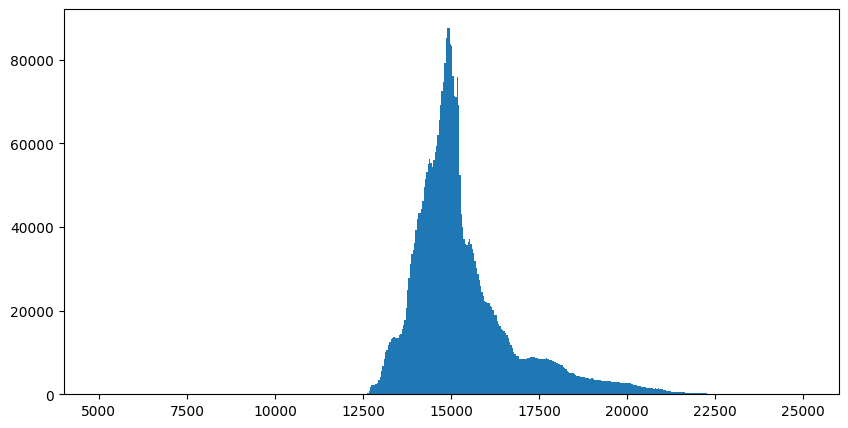

In [9]:
plt.figure(figsize=[10,5])
plt.hist(band_1_cropped.flatten(), bins=256*2,range= [5000,25000])
plt.show()

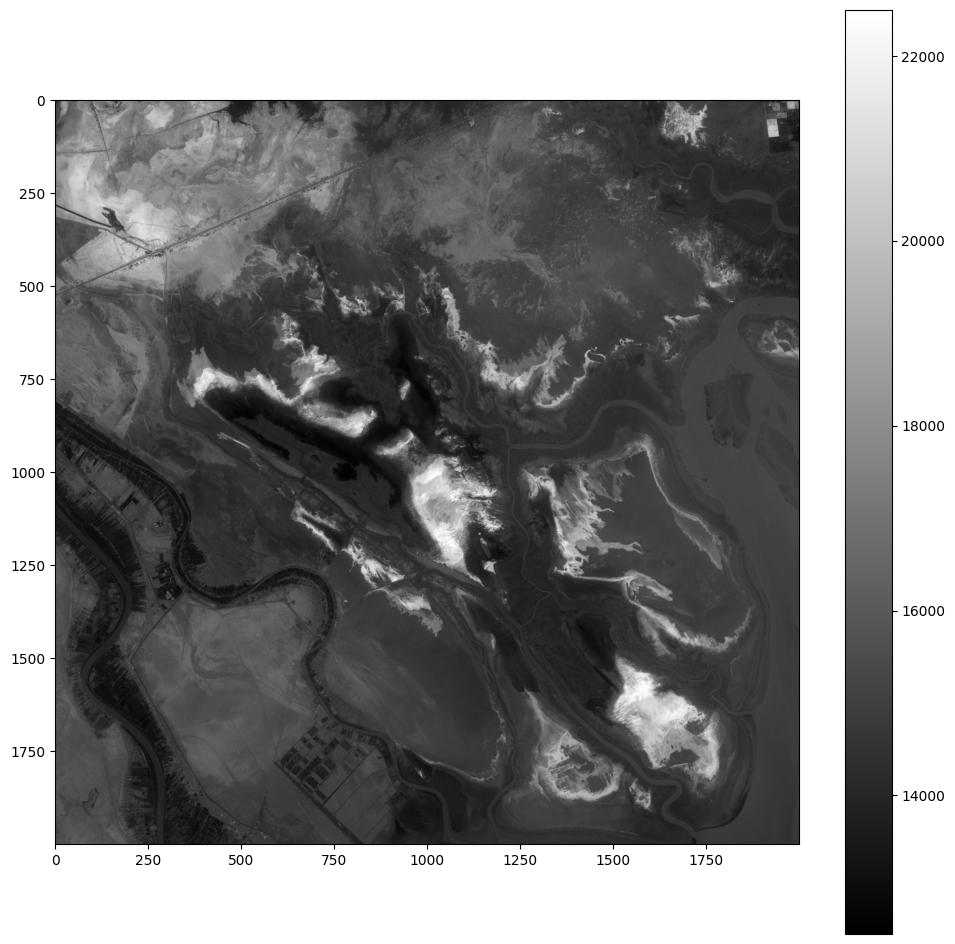

In [10]:
plt.figure(figsize=[12,12])
plt.imshow(band_1_cropped, vmin=12500, vmax=22500,cmap = 'gray')
plt.colorbar()

In [11]:
band_7 = band.pop(7)

In [12]:
band_7 = np.array(band_7)
band_7

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(15761, 15521), dtype=uint16)

In [13]:
bands = np.array(band)
bands.shape

(10, 7881, 7761)

In [14]:
bands_3D = np.stack(bands, axis=0)

In [15]:
bands_3D_T = bands_3D.transpose(1, 2, 0)

In [16]:
bands_3D_T.shape

(7881, 7761, 10)

In [17]:
reshaped = bands_3D_T.reshape(-1, 10)
print(reshaped.shape)

(61164441, 10)


Original shape: bands_3D_T.shape  # (7881, 7761, 10)

What reshape(-1, 10) means:

10 → the second dimension of the new array will have 10 elements (one for each band).

-1 → the first dimension will be calculated automatically so that the total number of elements is preserved. (-1 → automatically flatten the first two dimensions (pixels))

In [18]:
c = np.corrcoef(reshaped.T)

In [19]:
print(c.round(2))

[[1.   1.   0.99 0.95 0.89 0.84 0.83 0.99 0.96 0.96]
 [1.   1.   0.99 0.96 0.91 0.85 0.85 0.98 0.96 0.96]
 [0.99 0.99 1.   0.99 0.94 0.89 0.89 0.95 0.95 0.94]
 [0.95 0.96 0.99 1.   0.97 0.94 0.94 0.9  0.92 0.91]
 [0.89 0.91 0.94 0.97 1.   0.98 0.96 0.85 0.89 0.87]
 [0.84 0.85 0.89 0.94 0.98 1.   1.   0.79 0.85 0.83]
 [0.83 0.85 0.89 0.94 0.96 1.   1.   0.79 0.84 0.83]
 [0.99 0.98 0.95 0.9  0.85 0.79 0.79 1.   0.95 0.95]
 [0.96 0.96 0.95 0.92 0.89 0.85 0.84 0.95 1.   1.  ]
 [0.96 0.96 0.94 0.91 0.87 0.83 0.83 0.95 1.   1.  ]]


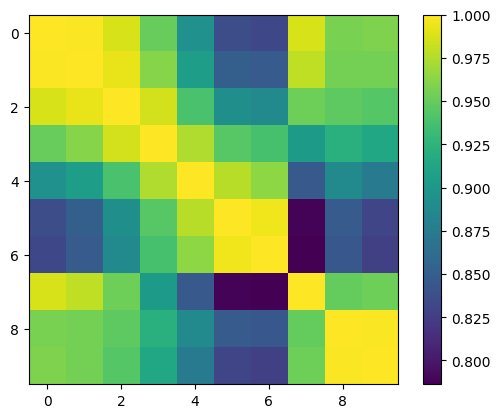

In [20]:
plt.imshow(c)
plt.colorbar()
plt.show()

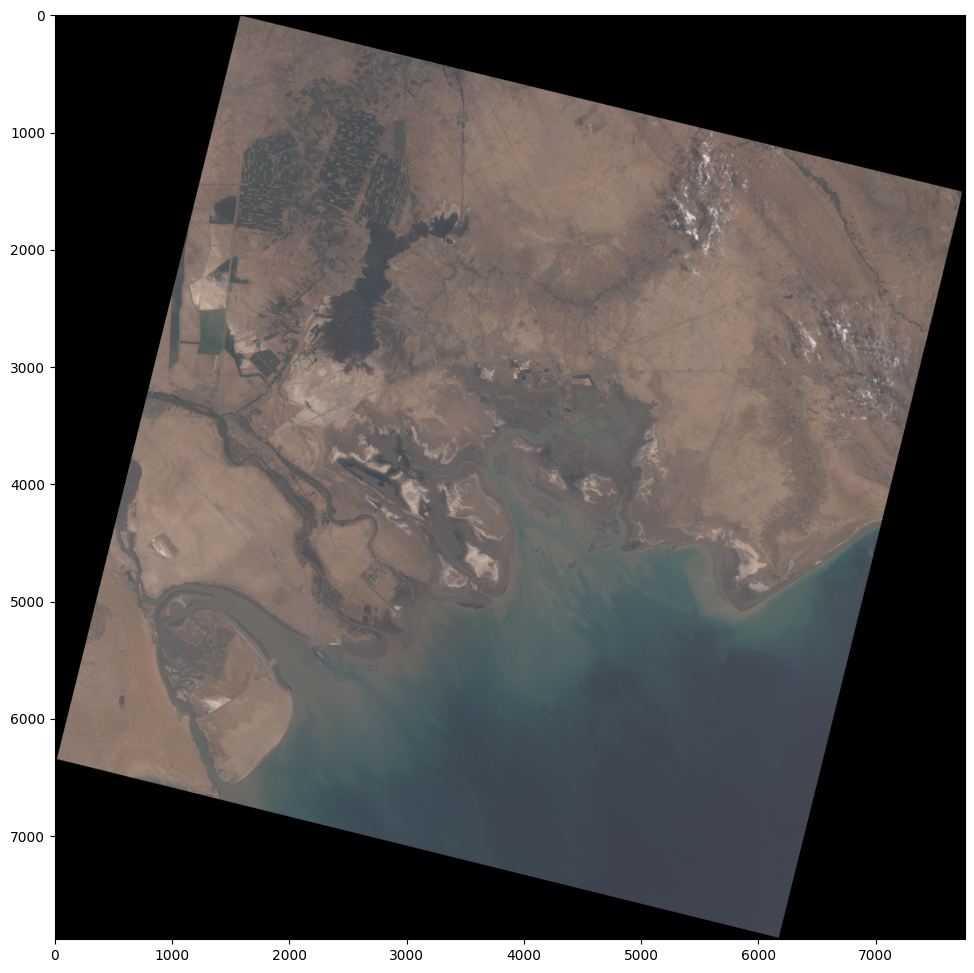

In [44]:
rgb_img = bands_3D_T[:, :, [3, 2, 1]].astype(np.float32)
rgb_img = rgb_img / rgb_img.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(rgb_img)
plt.show()

In [45]:
rgb_img_cropped = rgb_img[2000:5000,1500:4000].copy()
print(rgb_img_cropped.shape)

(3000, 2500, 3)


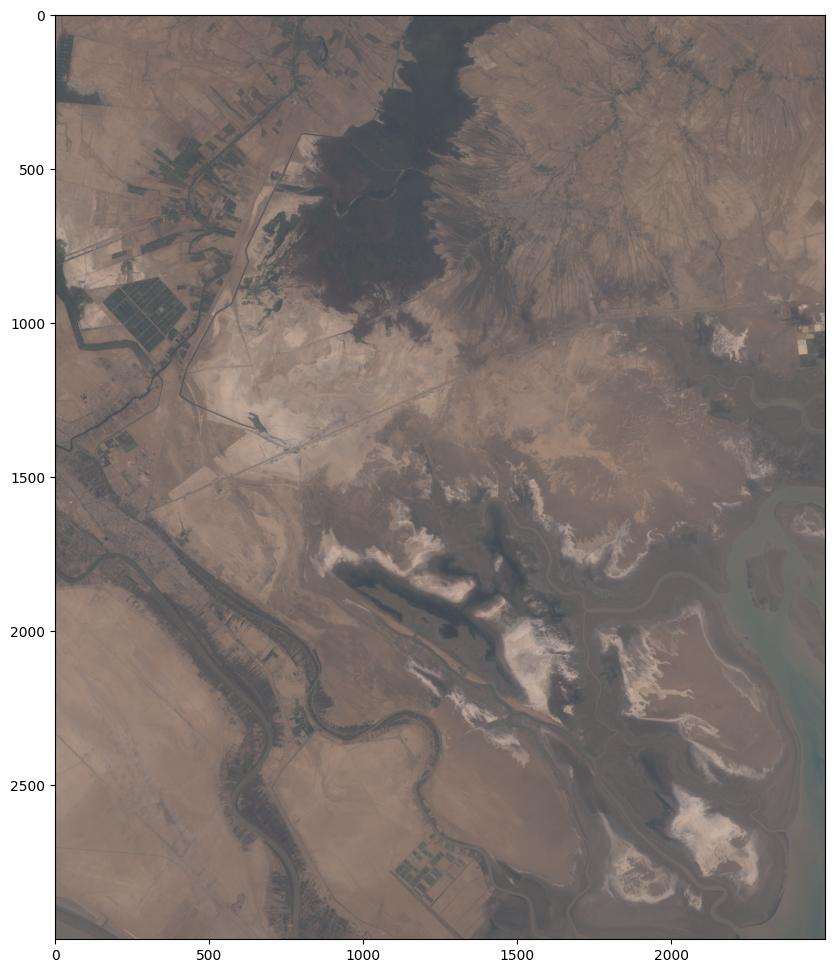

In [46]:
plt.figure(figsize=(12, 12))
plt.imshow(rgb_img_cropped)
plt.show()

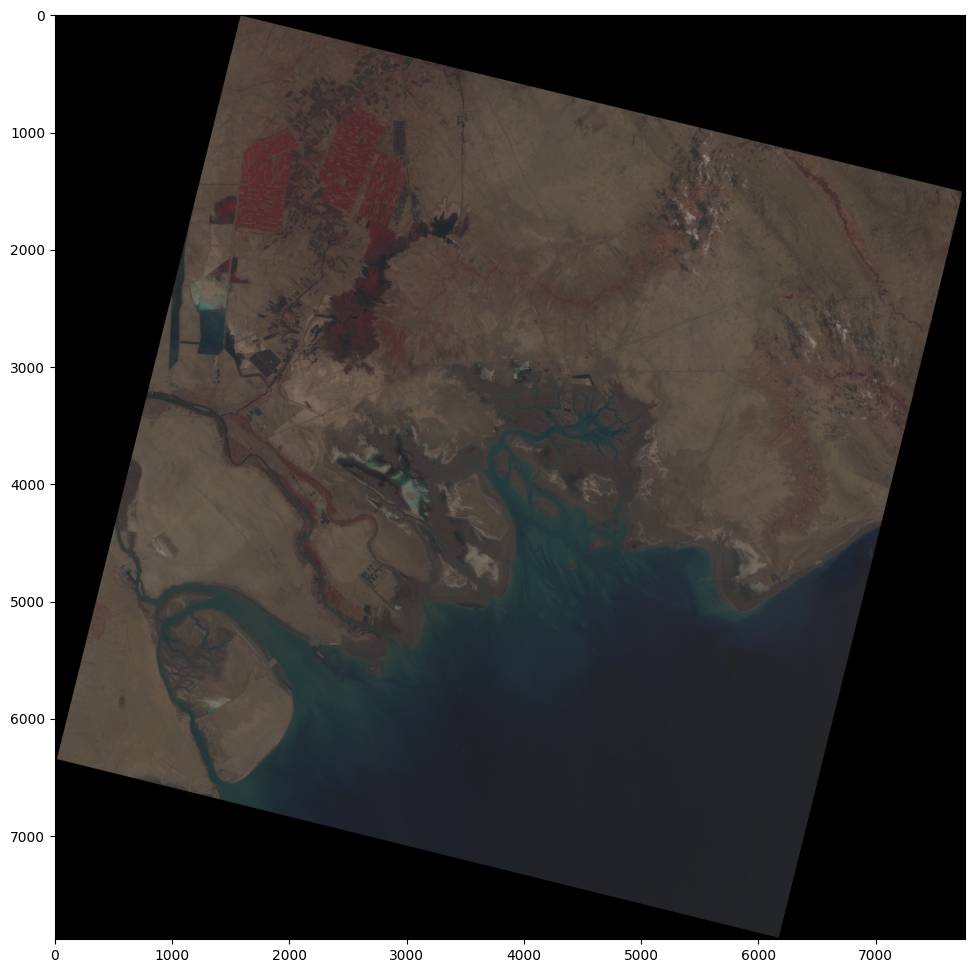

In [47]:
false_img = bands_3D_T[:, :, [4, 3, 2]].astype(np.float32)
false_img = false_img / false_img.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(false_img)
plt.show()

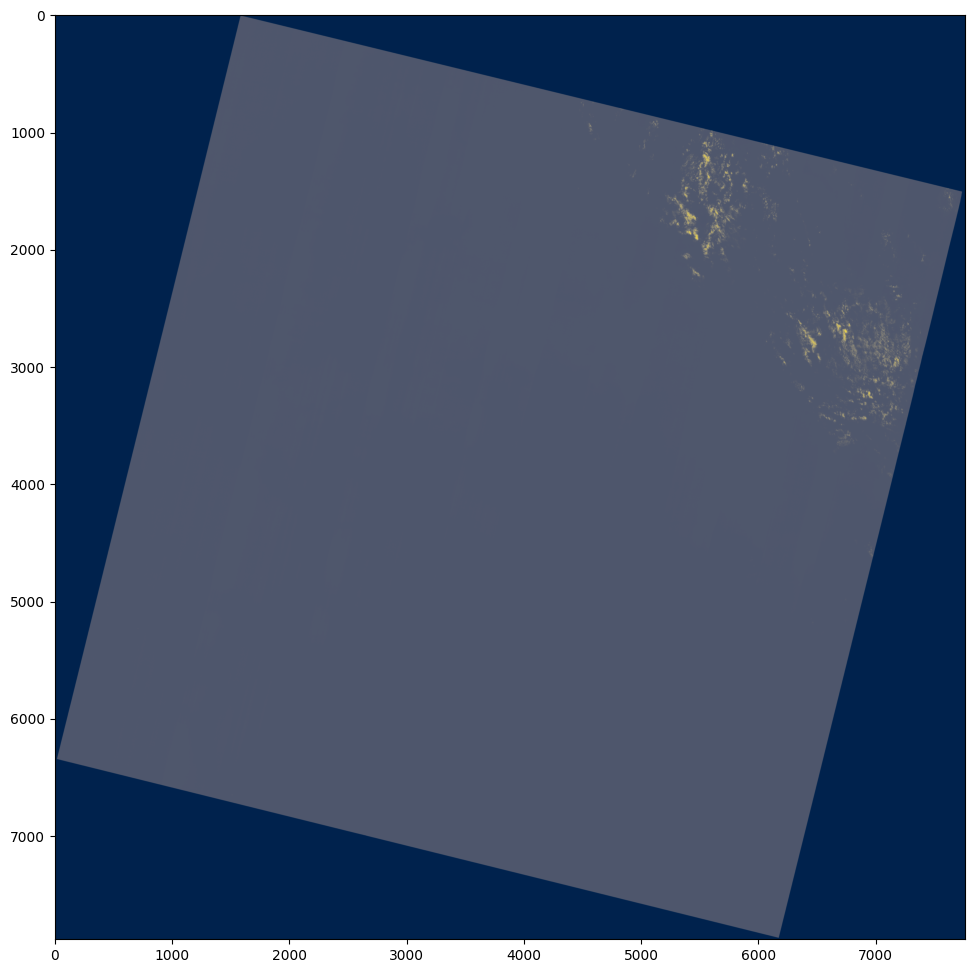

In [58]:
Cirrus_img = bands_3D_T[:, :, [7]].astype(np.float32)
Cirrus_img = Cirrus_img / Cirrus_img.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(Cirrus_img, cmap='cividis')
plt.show()

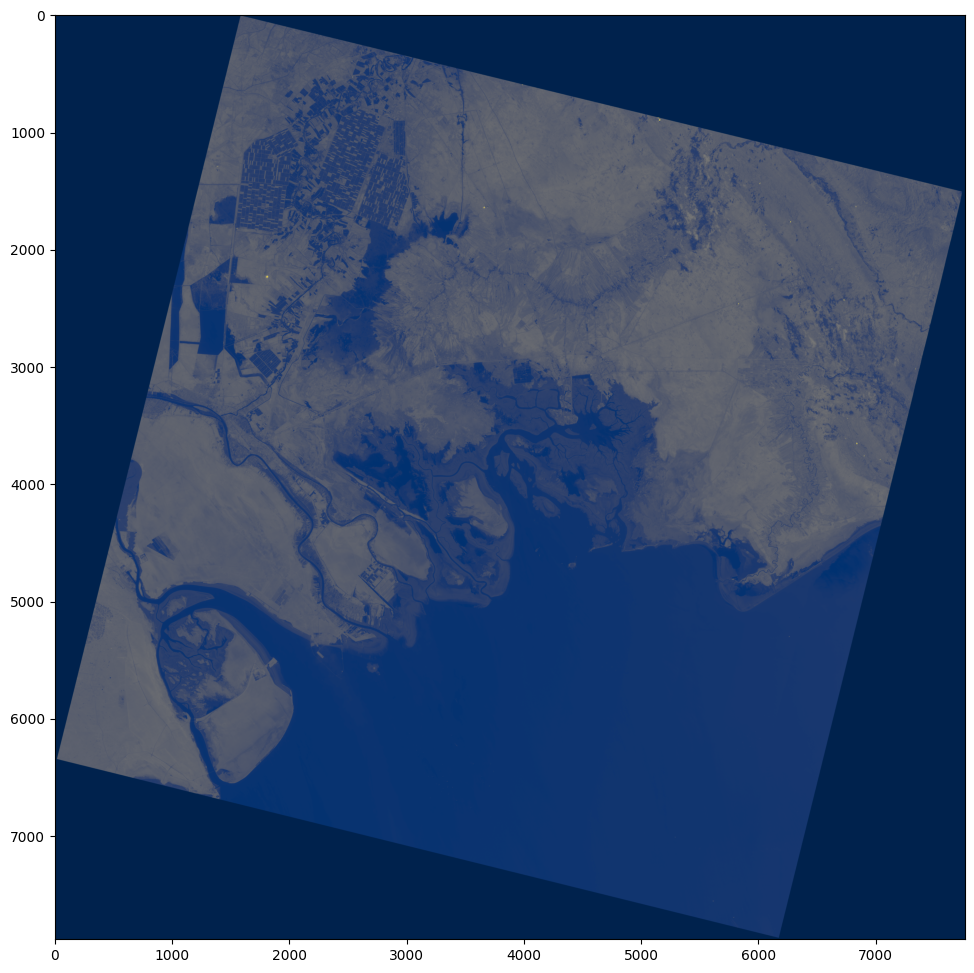

In [59]:
Panchromatic_img = bands_3D_T[:, :, [6]].astype(np.float32)
Panchromatic_img = Panchromatic_img / Panchromatic_img.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(Panchromatic_img, cmap='cividis')
plt.show()

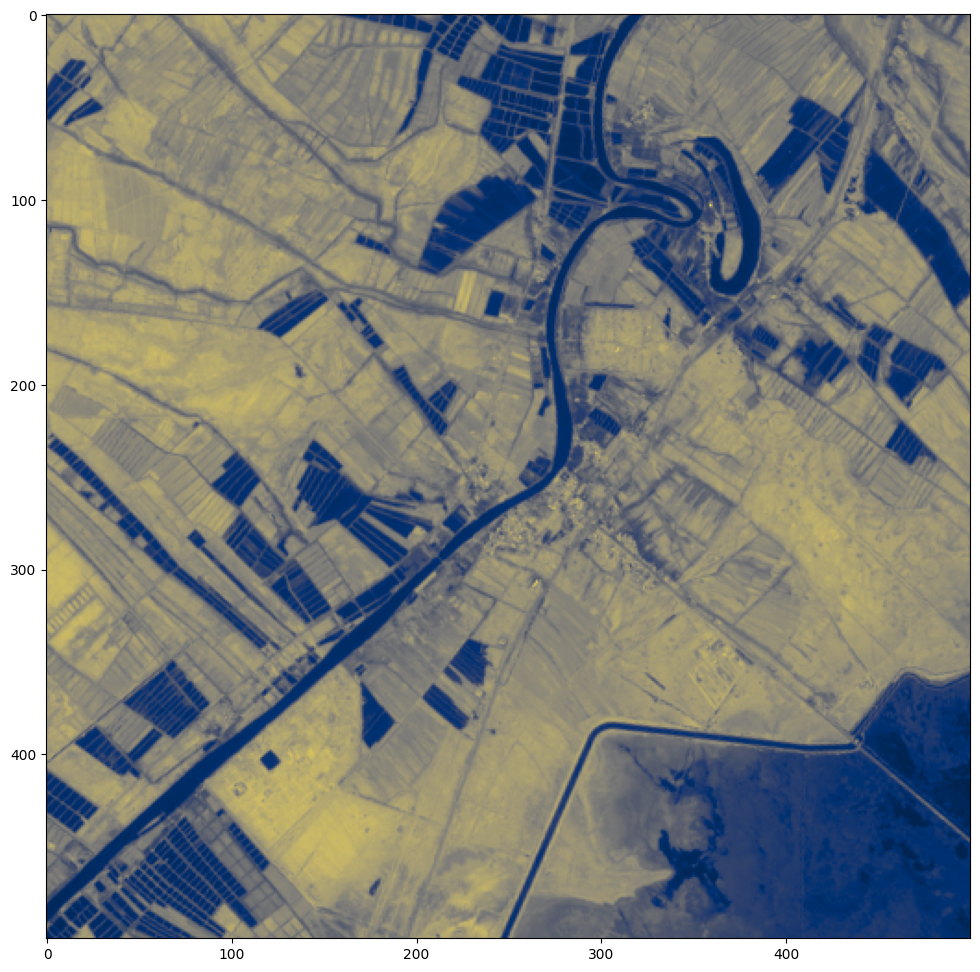

In [86]:
Panchromatic_img_cropped = bands_3D_T[:, :, [6]].astype(np.float32)
Panchromatic_img_cropped = Panchromatic_img_cropped[2000:2500,2000:2500].copy()
Panchromatic_img_cropped = Panchromatic_img_cropped / Panchromatic_img_cropped.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(Panchromatic_img_cropped, cmap='cividis')
plt.show()

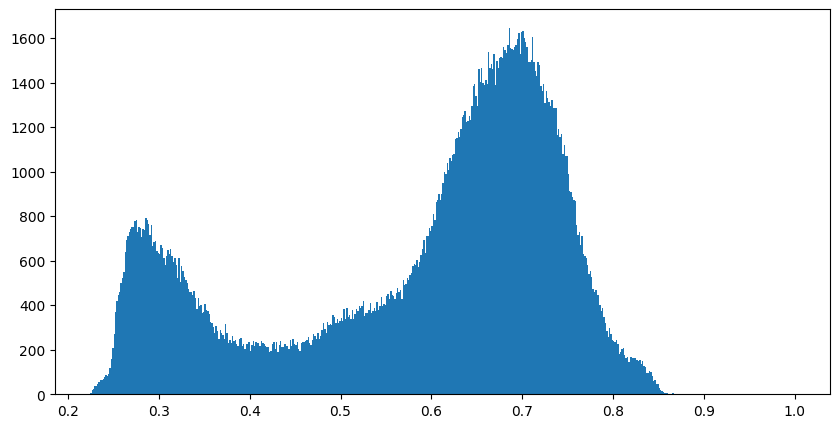

In [87]:
plt.figure(figsize=[10,5])
plt.hist(Panchromatic_img_cropped.flatten(), bins=256*2)
plt.show()

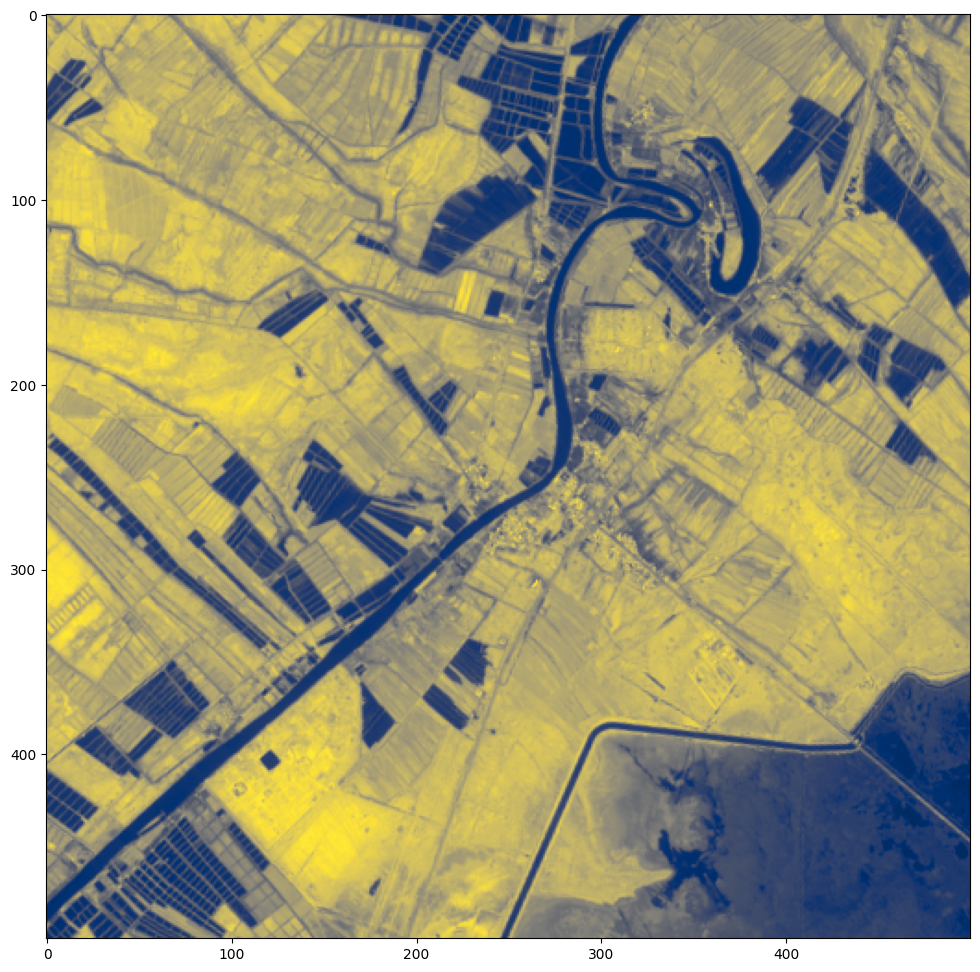

In [90]:
plt.figure(figsize=[12,12])
plt.imshow(Panchromatic_img_cropped, vmin=0.2, vmax=0.85, cmap='cividis')

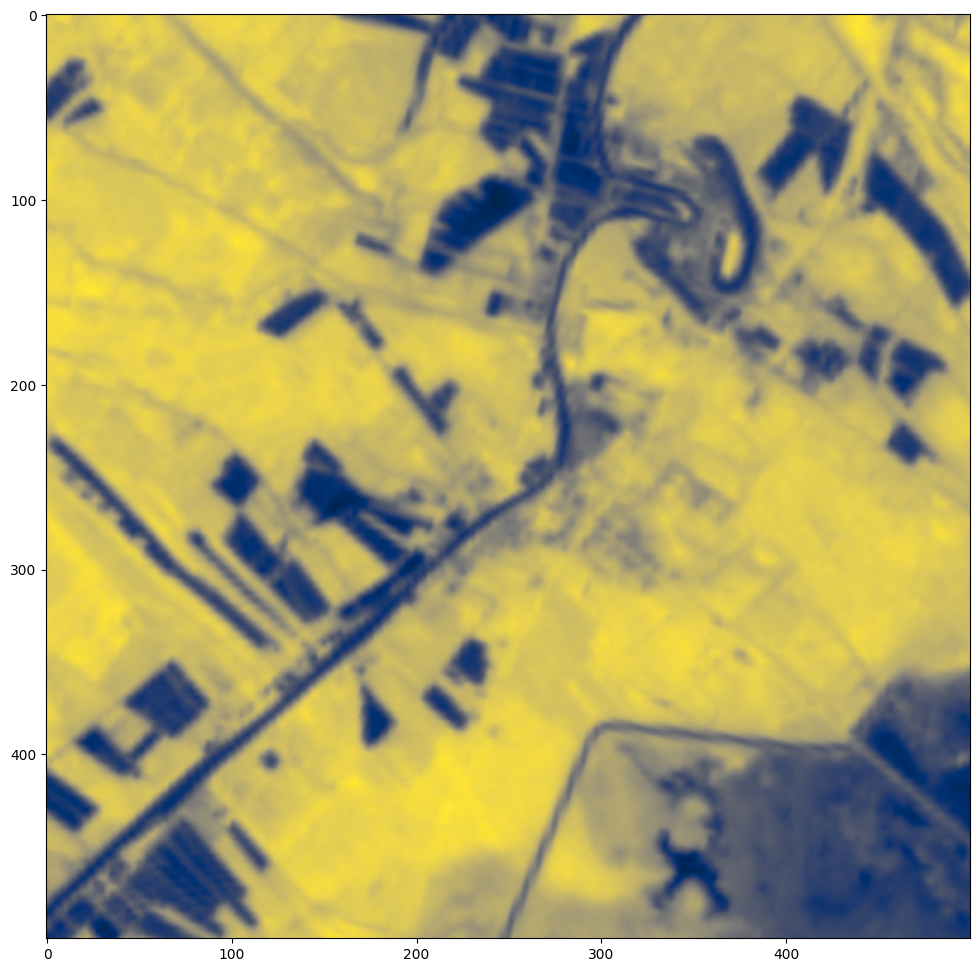

In [91]:
TIRS2_img_cropped = bands_3D_T[:, :, [9]].astype(np.float32)
TIRS2_img_cropped = TIRS2_img_cropped[2000:2500,2000:2500].copy()
TIRS2_img_cropped = TIRS2_img_cropped / TIRS2_img_cropped.max()       # normalized to 1
plt.figure(figsize=(12, 12))
plt.imshow(TIRS2_img_cropped, cmap='cividis')
plt.show()